Installing dependencies

In [3]:
pip install torch torchvision torchaudio nibabel numpy matplotlib tqdm


Note: you may need to restart the kernel to use updated packages.


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import nibabel as nib
import os
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm  

visualizing the nii files in the training dataset

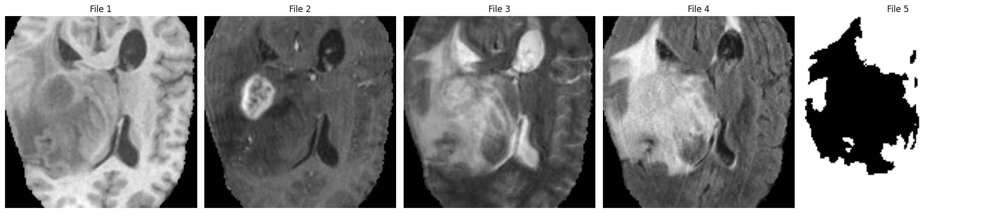

In [19]:
import matplotlib.pyplot as plt

# List of file paths
file_paths = [
    'E:/Images/Sample_001/Img1_Native_T1.nii',
    'E:/Images/Sample_001/Img2_T1_Gd_Weighted.nii',
    'E:/Images/Sample_001/Img3_T2_Weighted.nii',
    'E:/Images/Sample_001/Img4_T2_FLAIR.nii',
    'E:/Images/Sample_001/Img5_Segmented.nii'
]

# Initialize a figure for side-by-side comparison
plt.figure(figsize=(20, 10))

# Loop through each file
for i, file_path in enumerate(file_paths):
    # Load the NIfTI file
    nii_img = nib.load(file_path)
    image_data = nii_img.get_fdata()

    # Select the middle slice along the third axis
    slice_index = image_data.shape[2] // 2
    slice_data = image_data[:, :, slice_index]

    # If it's 4D (e.g., segmented file), take the first channel
    if len(slice_data.shape) > 2:
        slice_data = slice_data[..., 0]

    # Add the slice to the plot
    plt.subplot(1, len(file_paths), i + 1)
    plt.imshow(slice_data.T, cmap="gray", origin="lower") 
    plt.title(f"File {i + 1}", fontsize=12)
    plt.axis("off")

# Show the visualization
plt.tight_layout()
plt.show()

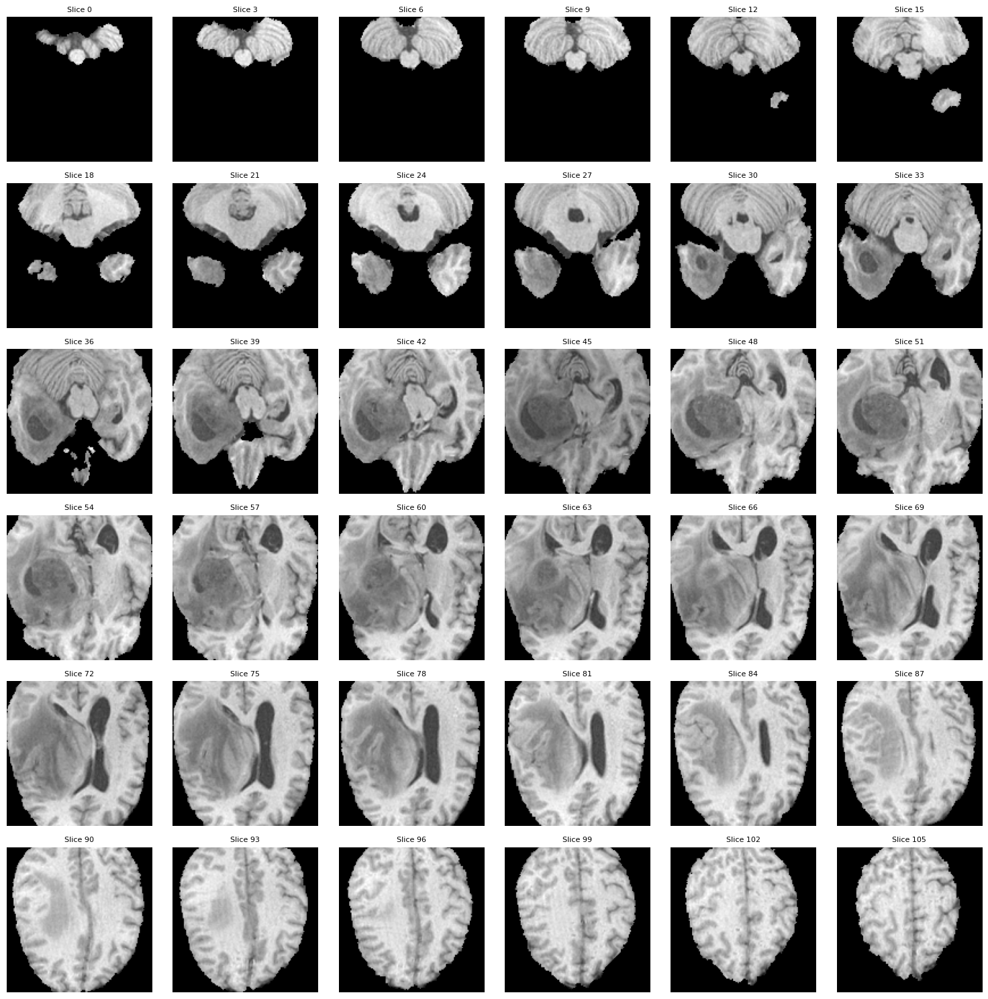

In [21]:

# File path to your NIfTI file 
file_path = 'E:/Images/Sample_001/Img1_Native_T1.nii'

# Load the NIfTI file
nii_img = nib.load(file_path)
image_data = nii_img.get_fdata()

# Number of rows and columns in the grid
num_rows = 6  
num_cols = 6  
num_slices = num_rows * num_cols

# Calculate step size to evenly sample slices across the volume
step = image_data.shape[2] // num_slices

# Create a grid layout for the slices
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 15))
axes = axes.flatten()

# Loop through slices and plot
for i, ax in enumerate(axes):
    slice_index = i * step
    if slice_index < image_data.shape[2]: 
        slice_data = image_data[:, :, slice_index]
        ax.imshow(slice_data.T, cmap="gray", origin="lower")  
        ax.axis("off")
        ax.set_title(f"Slice {slice_index}", fontsize=8)
    else:
        ax.axis("off") 
        
# Adjust layout and display
plt.tight_layout()
plt.show()


In [22]:
pip install imageio

Note: you may need to restart the kernel to use updated packages.


In [23]:

import imageio

# List of file paths
file_paths = [
    'E:/Images/Sample_001/Img1_Native_T1.nii',
    'E:/Images/Sample_001/Img2_T1_Gd_Weighted.nii',
    'E:/Images/Sample_001/Img3_T2_Weighted.nii',
    'E:/Images/Sample_001/Img4_T2_FLAIR.nii',
    'E:/Images/Sample_001/Img5_Segmented.nii'
]

# Directory to save GIFs
output_dir = './gifs/'
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

# Loop through each NIfTI file and create a GIF
for file_path in file_paths:
    # Load the NIfTI file
    nii_img = nib.load(file_path)
    image_data = nii_img.get_fdata()
    
    # Normalize the data for better visualization
    image_data = (image_data - np.min(image_data)) / (np.max(image_data) - np.min(image_data)) * 255
    image_data = image_data.astype(np.uint8)
    
    # Generate frames for the GIF
    frames = []
    for i in range(image_data.shape[2]):  # Loop through slices along the third axis
        slice_data = image_data[:, :, i]
        frames.append(slice_data)
    
    # Create output path for the GIF
    gif_name = os.path.basename(file_path).replace('.nii', '.gif')
    gif_output_path = os.path.join(output_dir, gif_name)
    
    # Save as a GIF
    imageio.mimsave(gif_output_path, frames, duration=0.1)  # Adjust duration as needed
    
    print(f"GIF saved to {gif_output_path}")


GIF saved to ./gifs/Img1_Native_T1.gif
GIF saved to ./gifs/Img2_T1_Gd_Weighted.gif
GIF saved to ./gifs/Img3_T2_Weighted.gif
GIF saved to ./gifs/Img4_T2_FLAIR.gif
GIF saved to ./gifs/Img5_Segmented.gif


GIF to show the 3d scan made up of 2d slices

Displaying Img1_Native_T1.gif


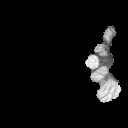

Displaying Img2_T1_Gd_Weighted.gif


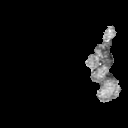

Displaying Img3_T2_Weighted.gif


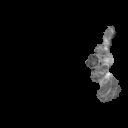

Displaying Img4_T2_FLAIR.gif


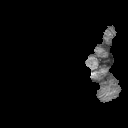

Displaying Img5_Segmented.gif


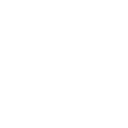

In [29]:
from IPython.display import display, Image
import os

# Directory where GIFs are stored
output_dir = './gifs/'

# List all GIF files in the directory
gif_files = [f for f in os.listdir(output_dir) if f.endswith('.gif')]

# Display each GIF
for gif_file in gif_files:
    gif_path = os.path.join(output_dir, gif_file)
    print(f"Displaying {gif_file}")
    display(Image(filename=gif_path))


Dataset Class

In [7]:
class MRI3DDataset(Dataset):
    def __init__(self, img_paths):
        self.img_paths = img_paths
        
        # Validate all paths exist at initialization
        for path in self.img_paths:
            if not os.path.exists(path):
                raise FileNotFoundError(f"Directory not found: {path}")
            required_files = [
                'Img1_Native_T1.nii',
                'Img2_T1_Gd_Weighted.nii',
                'Img3_T2_Weighted.nii',
                'Img4_T2_FLAIR.nii',
                'Img5_Segmented.nii'
            ]
            for file in required_files:
                if not os.path.exists(os.path.join(path, file)):
                    raise FileNotFoundError(f"Required file {file} not found in {path}")
    
    def load_nifti(self, path, is_segmentation=False):
        nii_img = nib.load(path)
        data = nii_img.get_fdata()
        data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
        tensor_data = torch.tensor(data, dtype=torch.float32)
        
        if is_segmentation and len(tensor_data.shape) == 4:
            tensor_data = tensor_data.permute(3, 0, 1, 2)
        
        return tensor_data

    def normalize(self, image):
        for i in range(image.shape[0]):
            min_val = torch.min(image[i])
            max_val = torch.max(image[i])
            if max_val - min_val != 0:
                image[i] = (image[i] - min_val) / (max_val - min_val)
            else:
                image[i] = torch.zeros_like(image[i])
        return image

    def __getitem__(self, idx):
        base_path = self.img_paths[idx]
        img_t1 = self.load_nifti(os.path.join(base_path, 'Img1_Native_T1.nii'))
        img_t1c = self.load_nifti(os.path.join(base_path, 'Img2_T1_Gd_Weighted.nii'))
        img_t2 = self.load_nifti(os.path.join(base_path, 'Img3_T2_Weighted.nii'))
        img_flair = self.load_nifti(os.path.join(base_path, 'Img4_T2_FLAIR.nii'))
        img_seg = self.load_nifti(os.path.join(base_path, 'Img5_Segmented.nii'), is_segmentation=True)
        
        # Stack the images along the channel dimension
        image = torch.stack([img_t1, img_t1c, img_t2, img_flair], dim=0)
        
        # Normalize the input images
        image = self.normalize(image)
        
        return image, img_seg

    def __len__(self):
        return len(self.img_paths)

Unet Model

In [8]:
class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet3D, self).__init__()
        
        # Encoder
        self.enc1 = self.conv_block(in_channels, 32)
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc2 = self.conv_block(32, 64)
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc3 = self.conv_block(64, 128)
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.enc4 = self.conv_block(128, 256)
        self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2)
        
        # Bottleneck
        self.bottleneck = self.conv_block(256, 512)
        
        # Decoder
        self.upconv4 = nn.ConvTranspose3d(512, 256, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(512, 256)
        self.upconv3 = nn.ConvTranspose3d(256, 128, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(256, 128)
        self.upconv2 = nn.ConvTranspose3d(128, 64, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(128, 64)
        self.upconv1 = nn.ConvTranspose3d(64, 32, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(64, 32)
        
        self.final = nn.Conv3d(32, out_channels, kernel_size=1)
        
        self.apply(self._init_weights)
    
    def _init_weights(self, m):
        if isinstance(m, nn.Conv3d) or isinstance(m, nn.ConvTranspose3d):
            nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
    
    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))
        
        # Bottleneck
        b = self.bottleneck(self.pool4(e4))
        
        # Decoder with skip connections
        d4 = self.dec4(torch.cat([self.upconv4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.upconv3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.upconv2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.upconv1(d2), e1], dim=1))
        
        return self.final(d1)

Dice score function

In [9]:
def dice_score(pred, target, smooth=1e-6):

    # Flatten the predictions and targets
    pred = pred.view(-1)
    target = target.view(-1)
    
    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)
    return dice.item()

Training Function

In [15]:
def train_model(model, train_loader, num_epochs, device):
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)
    
    best_dice = 0.0
    print("Starting training...")

    # Add tqdm to the epoch loop for progress visualization
    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        epoch_dice = 0.0
        num_batches = 0
        
        with tqdm(train_loader, unit="batch", desc=f"Epoch {epoch+1}/{num_epochs}") as batch_bar:
            for data, target in batch_bar:
                
                data = data.to(device)
                target = target.to(device)
                
                # Ensure target has batch dimension
                if len(target.shape) == 4:
                    target = target.unsqueeze(0)
                
                optimizer.zero_grad()
                output = model(data)
                
                target_indices = torch.argmax(target, dim=1)
                
                # Calculate loss
                loss = criterion(output, target_indices)
                loss.backward()
                
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
                
                # Calculate metrics
                with torch.no_grad():
                    pred = torch.argmax(output, dim=1)
                    # Convert predictions and targets to one-hot for dice calculation
                    pred_one_hot = torch.zeros_like(output)
                    pred_one_hot.scatter_(1, pred.unsqueeze(1), 1)
                    dice = dice_score(pred_one_hot, target)
                
                epoch_loss += loss.item()
                epoch_dice += dice
                num_batches += 1
                
                # Update the tqdm description with the current batch's loss and dice score
                batch_bar.set_postfix(loss=loss.item(), dice=dice)
        
        # Calculate epoch metrics
        epoch_loss /= num_batches
        epoch_dice /= num_batches
        
        print(f'Epoch {epoch+1}/{num_epochs} - Loss: {epoch_loss:.4f} Dice Score: {epoch_dice:.4f}')
        
        # Update learning rate
        scheduler.step(epoch_loss)
        
        # Save best model
        if epoch_dice > best_dice:
            best_dice = epoch_dice
            torch.save(model.state_dict(), 'best_model.pth')

Training the Model ( Loss and Dice Score mentioned after each epoch )

In [16]:
if __name__ == "__main__":
    # reproducibility
    torch.manual_seed(42)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(42)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

    # Example usage
    train_img_paths = [
        "E:/Images/Sample_001/",
        "E:/Images/Sample_002/",
    ]

    try:
        train_dataset = MRI3DDataset(train_img_paths)
        train_loader = DataLoader(
            train_dataset,
            batch_size=4,
            shuffle=True,
            num_workers=0,
            pin_memory=True if torch.cuda.is_available() else False
        )
        
        model = UNet3D(in_channels=4, out_channels=4)
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        
        train_model(model, train_loader, num_epochs=100, device=device)
        
    except Exception as e:
        print(f"Error during setup: {str(e)}")
        raise

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Starting training...


Epoch 1/100: 100%|██████████| 1/1 [00:22<00:00, 22.82s/batch, dice=0.0693, loss=4.37]


Epoch 1/100 - Loss: 4.3659 Dice Score: 0.0693


Epoch 2/100: 100%|██████████| 1/1 [00:21<00:00, 21.65s/batch, dice=0.0802, loss=3.67]


Epoch 2/100 - Loss: 3.6728 Dice Score: 0.0802


Epoch 3/100: 100%|██████████| 1/1 [00:20<00:00, 20.63s/batch, dice=0.121, loss=3.1]


Epoch 3/100 - Loss: 3.0989 Dice Score: 0.1206


Epoch 4/100: 100%|██████████| 1/1 [00:20<00:00, 20.43s/batch, dice=0.166, loss=2.6]


Epoch 4/100 - Loss: 2.6038 Dice Score: 0.1659


Epoch 5/100: 100%|██████████| 1/1 [00:21<00:00, 21.13s/batch, dice=0.257, loss=2.18]


Epoch 5/100 - Loss: 2.1795 Dice Score: 0.2573


Epoch 6/100: 100%|██████████| 1/1 [00:21<00:00, 21.11s/batch, dice=0.438, loss=1.84]


Epoch 6/100 - Loss: 1.8365 Dice Score: 0.4382


Epoch 7/100: 100%|██████████| 1/1 [00:20<00:00, 20.94s/batch, dice=0.569, loss=1.57]


Epoch 7/100 - Loss: 1.5685 Dice Score: 0.5688


Epoch 8/100: 100%|██████████| 1/1 [00:20<00:00, 20.24s/batch, dice=0.65, loss=1.35]


Epoch 8/100 - Loss: 1.3515 Dice Score: 0.6504


Epoch 9/100: 100%|██████████| 1/1 [00:20<00:00, 20.38s/batch, dice=0.714, loss=1.18]


Epoch 9/100 - Loss: 1.1797 Dice Score: 0.7135


Epoch 10/100: 100%|██████████| 1/1 [00:21<00:00, 21.26s/batch, dice=0.769, loss=1.03]


Epoch 10/100 - Loss: 1.0284 Dice Score: 0.7687


Epoch 11/100: 100%|██████████| 1/1 [00:22<00:00, 22.08s/batch, dice=0.813, loss=0.902]


Epoch 11/100 - Loss: 0.9016 Dice Score: 0.8127


Epoch 12/100: 100%|██████████| 1/1 [00:20<00:00, 20.50s/batch, dice=0.848, loss=0.788]


Epoch 12/100 - Loss: 0.7884 Dice Score: 0.8476


Epoch 13/100: 100%|██████████| 1/1 [00:20<00:00, 20.26s/batch, dice=0.877, loss=0.695]


Epoch 13/100 - Loss: 0.6949 Dice Score: 0.8773


Epoch 14/100: 100%|██████████| 1/1 [00:22<00:00, 22.27s/batch, dice=0.896, loss=0.641]


Epoch 14/100 - Loss: 0.6411 Dice Score: 0.8962


Epoch 15/100: 100%|██████████| 1/1 [00:20<00:00, 20.69s/batch, dice=0.911, loss=0.564]


Epoch 15/100 - Loss: 0.5637 Dice Score: 0.9110


Epoch 16/100: 100%|██████████| 1/1 [00:20<00:00, 20.34s/batch, dice=0.922, loss=0.513]


Epoch 16/100 - Loss: 0.5129 Dice Score: 0.9224


Epoch 17/100: 100%|██████████| 1/1 [00:20<00:00, 20.13s/batch, dice=0.937, loss=0.464]


Epoch 17/100 - Loss: 0.4643 Dice Score: 0.9367


Epoch 18/100: 100%|██████████| 1/1 [00:20<00:00, 20.78s/batch, dice=0.955, loss=0.422]


Epoch 18/100 - Loss: 0.4218 Dice Score: 0.9554


Epoch 19/100: 100%|██████████| 1/1 [00:20<00:00, 20.54s/batch, dice=0.964, loss=0.383]


Epoch 19/100 - Loss: 0.3835 Dice Score: 0.9643


Epoch 20/100: 100%|██████████| 1/1 [00:20<00:00, 20.01s/batch, dice=0.968, loss=0.352]


Epoch 20/100 - Loss: 0.3522 Dice Score: 0.9680


Epoch 21/100: 100%|██████████| 1/1 [00:21<00:00, 21.21s/batch, dice=0.971, loss=0.323]


Epoch 21/100 - Loss: 0.3228 Dice Score: 0.9711


Epoch 22/100: 100%|██████████| 1/1 [00:20<00:00, 20.33s/batch, dice=0.974, loss=0.298]


Epoch 22/100 - Loss: 0.2981 Dice Score: 0.9737


Epoch 23/100: 100%|██████████| 1/1 [00:20<00:00, 20.31s/batch, dice=0.975, loss=0.28]


Epoch 23/100 - Loss: 0.2799 Dice Score: 0.9754


Epoch 24/100: 100%|██████████| 1/1 [00:20<00:00, 20.15s/batch, dice=0.977, loss=0.268]


Epoch 24/100 - Loss: 0.2677 Dice Score: 0.9767


Epoch 25/100: 100%|██████████| 1/1 [00:20<00:00, 20.95s/batch, dice=0.977, loss=0.258]


Epoch 25/100 - Loss: 0.2578 Dice Score: 0.9770


Epoch 26/100: 100%|██████████| 1/1 [00:20<00:00, 20.12s/batch, dice=0.979, loss=0.245]


Epoch 26/100 - Loss: 0.2448 Dice Score: 0.9794


Epoch 27/100: 100%|██████████| 1/1 [00:20<00:00, 20.26s/batch, dice=0.98, loss=0.234]


Epoch 27/100 - Loss: 0.2341 Dice Score: 0.9804


Epoch 28/100: 100%|██████████| 1/1 [00:20<00:00, 20.77s/batch, dice=0.981, loss=0.227]


Epoch 28/100 - Loss: 0.2268 Dice Score: 0.9805


Epoch 29/100: 100%|██████████| 1/1 [00:20<00:00, 20.23s/batch, dice=0.982, loss=0.218]


Epoch 29/100 - Loss: 0.2177 Dice Score: 0.9821


Epoch 30/100: 100%|██████████| 1/1 [00:20<00:00, 20.10s/batch, dice=0.983, loss=0.21]


Epoch 30/100 - Loss: 0.2105 Dice Score: 0.9827


Epoch 31/100: 100%|██████████| 1/1 [00:20<00:00, 20.20s/batch, dice=0.983, loss=0.205]


Epoch 31/100 - Loss: 0.2046 Dice Score: 0.9831


Epoch 32/100: 100%|██████████| 1/1 [00:20<00:00, 20.20s/batch, dice=0.983, loss=0.198]


Epoch 32/100 - Loss: 0.1984 Dice Score: 0.9832


Epoch 33/100: 100%|██████████| 1/1 [00:21<00:00, 21.44s/batch, dice=0.984, loss=0.192]


Epoch 33/100 - Loss: 0.1923 Dice Score: 0.9838


Epoch 34/100: 100%|██████████| 1/1 [00:21<00:00, 21.30s/batch, dice=0.984, loss=0.187]


Epoch 34/100 - Loss: 0.1870 Dice Score: 0.9842


Epoch 35/100: 100%|██████████| 1/1 [00:19<00:00, 19.98s/batch, dice=0.984, loss=0.182]


Epoch 35/100 - Loss: 0.1817 Dice Score: 0.9843


Epoch 36/100: 100%|██████████| 1/1 [00:20<00:00, 20.36s/batch, dice=0.985, loss=0.176]


Epoch 36/100 - Loss: 0.1765 Dice Score: 0.9852


Epoch 37/100: 100%|██████████| 1/1 [00:20<00:00, 20.41s/batch, dice=0.986, loss=0.172]


Epoch 37/100 - Loss: 0.1717 Dice Score: 0.9856


Epoch 38/100: 100%|██████████| 1/1 [00:20<00:00, 20.29s/batch, dice=0.986, loss=0.167]


Epoch 38/100 - Loss: 0.1672 Dice Score: 0.9861


Epoch 39/100: 100%|██████████| 1/1 [00:21<00:00, 21.08s/batch, dice=0.986, loss=0.163]


Epoch 39/100 - Loss: 0.1633 Dice Score: 0.9864


Epoch 40/100: 100%|██████████| 1/1 [00:22<00:00, 22.01s/batch, dice=0.986, loss=0.16]


Epoch 40/100 - Loss: 0.1600 Dice Score: 0.9863


Epoch 41/100: 100%|██████████| 1/1 [00:20<00:00, 20.44s/batch, dice=0.987, loss=0.157]


Epoch 41/100 - Loss: 0.1566 Dice Score: 0.9870


Epoch 42/100: 100%|██████████| 1/1 [00:20<00:00, 20.04s/batch, dice=0.987, loss=0.154]


Epoch 42/100 - Loss: 0.1539 Dice Score: 0.9872


Epoch 43/100: 100%|██████████| 1/1 [00:20<00:00, 20.01s/batch, dice=0.987, loss=0.152]


Epoch 43/100 - Loss: 0.1516 Dice Score: 0.9872


Epoch 44/100: 100%|██████████| 1/1 [00:20<00:00, 20.12s/batch, dice=0.988, loss=0.149]


Epoch 44/100 - Loss: 0.1493 Dice Score: 0.9876


Epoch 45/100: 100%|██████████| 1/1 [00:21<00:00, 21.67s/batch, dice=0.988, loss=0.147]


Epoch 45/100 - Loss: 0.1468 Dice Score: 0.9877


Epoch 46/100: 100%|██████████| 1/1 [00:20<00:00, 20.95s/batch, dice=0.988, loss=0.145]


Epoch 46/100 - Loss: 0.1445 Dice Score: 0.9881


Epoch 47/100: 100%|██████████| 1/1 [00:20<00:00, 20.13s/batch, dice=0.988, loss=0.142]


Epoch 47/100 - Loss: 0.1425 Dice Score: 0.9881


Epoch 48/100: 100%|██████████| 1/1 [00:19<00:00, 19.85s/batch, dice=0.988, loss=0.14]


Epoch 48/100 - Loss: 0.1404 Dice Score: 0.9882


Epoch 49/100: 100%|██████████| 1/1 [00:20<00:00, 20.33s/batch, dice=0.989, loss=0.139]


Epoch 49/100 - Loss: 0.1387 Dice Score: 0.9885


Epoch 50/100: 100%|██████████| 1/1 [00:20<00:00, 20.09s/batch, dice=0.988, loss=0.137]


Epoch 50/100 - Loss: 0.1370 Dice Score: 0.9885


Epoch 51/100: 100%|██████████| 1/1 [00:20<00:00, 20.05s/batch, dice=0.989, loss=0.136]


Epoch 51/100 - Loss: 0.1356 Dice Score: 0.9888


Epoch 52/100: 100%|██████████| 1/1 [00:20<00:00, 20.06s/batch, dice=0.989, loss=0.134]


Epoch 52/100 - Loss: 0.1341 Dice Score: 0.9886


Epoch 53/100: 100%|██████████| 1/1 [00:20<00:00, 20.14s/batch, dice=0.989, loss=0.132]


Epoch 53/100 - Loss: 0.1323 Dice Score: 0.9890


Epoch 54/100: 100%|██████████| 1/1 [00:20<00:00, 20.46s/batch, dice=0.989, loss=0.131]


Epoch 54/100 - Loss: 0.1308 Dice Score: 0.9891


Epoch 55/100: 100%|██████████| 1/1 [00:20<00:00, 20.63s/batch, dice=0.989, loss=0.129]


Epoch 55/100 - Loss: 0.1292 Dice Score: 0.9892


Epoch 56/100: 100%|██████████| 1/1 [00:20<00:00, 20.96s/batch, dice=0.99, loss=0.128]


Epoch 56/100 - Loss: 0.1278 Dice Score: 0.9895


Epoch 57/100: 100%|██████████| 1/1 [00:20<00:00, 20.39s/batch, dice=0.989, loss=0.127]


Epoch 57/100 - Loss: 0.1270 Dice Score: 0.9894


Epoch 58/100: 100%|██████████| 1/1 [00:20<00:00, 20.91s/batch, dice=0.99, loss=0.125]


Epoch 58/100 - Loss: 0.1253 Dice Score: 0.9896


Epoch 59/100: 100%|██████████| 1/1 [00:20<00:00, 20.16s/batch, dice=0.99, loss=0.124]


Epoch 59/100 - Loss: 0.1237 Dice Score: 0.9899


Epoch 60/100: 100%|██████████| 1/1 [00:20<00:00, 20.21s/batch, dice=0.99, loss=0.123]


Epoch 60/100 - Loss: 0.1228 Dice Score: 0.9899


Epoch 61/100: 100%|██████████| 1/1 [00:20<00:00, 20.17s/batch, dice=0.99, loss=0.122]


Epoch 61/100 - Loss: 0.1215 Dice Score: 0.9900


Epoch 62/100: 100%|██████████| 1/1 [00:20<00:00, 20.12s/batch, dice=0.99, loss=0.12]


Epoch 62/100 - Loss: 0.1203 Dice Score: 0.9901


Epoch 63/100: 100%|██████████| 1/1 [00:20<00:00, 20.25s/batch, dice=0.99, loss=0.119]


Epoch 63/100 - Loss: 0.1193 Dice Score: 0.9903


Epoch 64/100: 100%|██████████| 1/1 [00:20<00:00, 20.83s/batch, dice=0.99, loss=0.118]


Epoch 64/100 - Loss: 0.1183 Dice Score: 0.9903


Epoch 65/100: 100%|██████████| 1/1 [00:20<00:00, 20.39s/batch, dice=0.991, loss=0.117]


Epoch 65/100 - Loss: 0.1171 Dice Score: 0.9905


Epoch 66/100: 100%|██████████| 1/1 [00:20<00:00, 20.75s/batch, dice=0.991, loss=0.116]


Epoch 66/100 - Loss: 0.1161 Dice Score: 0.9905


Epoch 67/100: 100%|██████████| 1/1 [00:20<00:00, 20.20s/batch, dice=0.991, loss=0.115]


Epoch 67/100 - Loss: 0.1152 Dice Score: 0.9906


Epoch 68/100: 100%|██████████| 1/1 [00:20<00:00, 20.21s/batch, dice=0.991, loss=0.114]


Epoch 68/100 - Loss: 0.1144 Dice Score: 0.9908


Epoch 69/100: 100%|██████████| 1/1 [00:21<00:00, 21.95s/batch, dice=0.99, loss=0.114]


Epoch 69/100 - Loss: 0.1138 Dice Score: 0.9905


Epoch 70/100: 100%|██████████| 1/1 [00:20<00:00, 20.49s/batch, dice=0.991, loss=0.113]


Epoch 70/100 - Loss: 0.1133 Dice Score: 0.9907


Epoch 71/100: 100%|██████████| 1/1 [00:20<00:00, 20.50s/batch, dice=0.99, loss=0.114]


Epoch 71/100 - Loss: 0.1138 Dice Score: 0.9899


Epoch 72/100: 100%|██████████| 1/1 [00:20<00:00, 20.11s/batch, dice=0.991, loss=0.111]


Epoch 72/100 - Loss: 0.1112 Dice Score: 0.9910


Epoch 73/100: 100%|██████████| 1/1 [00:20<00:00, 20.17s/batch, dice=0.991, loss=0.111]


Epoch 73/100 - Loss: 0.1110 Dice Score: 0.9908


Epoch 74/100: 100%|██████████| 1/1 [00:19<00:00, 19.98s/batch, dice=0.99, loss=0.111]


Epoch 74/100 - Loss: 0.1114 Dice Score: 0.9900


Epoch 75/100: 100%|██████████| 1/1 [00:20<00:00, 20.11s/batch, dice=0.991, loss=0.109]


Epoch 75/100 - Loss: 0.1095 Dice Score: 0.9908


Epoch 76/100: 100%|██████████| 1/1 [00:20<00:00, 20.17s/batch, dice=0.991, loss=0.109]


Epoch 76/100 - Loss: 0.1094 Dice Score: 0.9909


Epoch 77/100: 100%|██████████| 1/1 [00:21<00:00, 21.31s/batch, dice=0.991, loss=0.109]


Epoch 77/100 - Loss: 0.1085 Dice Score: 0.9905


Epoch 78/100: 100%|██████████| 1/1 [00:22<00:00, 22.42s/batch, dice=0.991, loss=0.107]


Epoch 78/100 - Loss: 0.1073 Dice Score: 0.9909


Epoch 79/100: 100%|██████████| 1/1 [00:22<00:00, 22.90s/batch, dice=0.991, loss=0.107]


Epoch 79/100 - Loss: 0.1070 Dice Score: 0.9910


Epoch 80/100: 100%|██████████| 1/1 [00:20<00:00, 20.55s/batch, dice=0.991, loss=0.105]


Epoch 80/100 - Loss: 0.1055 Dice Score: 0.9913


Epoch 81/100: 100%|██████████| 1/1 [00:20<00:00, 20.61s/batch, dice=0.991, loss=0.105]


Epoch 81/100 - Loss: 0.1053 Dice Score: 0.9911


Epoch 82/100: 100%|██████████| 1/1 [00:20<00:00, 20.77s/batch, dice=0.992, loss=0.104]


Epoch 82/100 - Loss: 0.1042 Dice Score: 0.9916


Epoch 83/100: 100%|██████████| 1/1 [00:20<00:00, 20.57s/batch, dice=0.991, loss=0.104]


Epoch 83/100 - Loss: 0.1043 Dice Score: 0.9913


Epoch 84/100: 100%|██████████| 1/1 [00:20<00:00, 20.23s/batch, dice=0.992, loss=0.104]


Epoch 84/100 - Loss: 0.1036 Dice Score: 0.9915


Epoch 85/100: 100%|██████████| 1/1 [00:20<00:00, 20.03s/batch, dice=0.991, loss=0.103]


Epoch 85/100 - Loss: 0.1033 Dice Score: 0.9913


Epoch 86/100: 100%|██████████| 1/1 [00:20<00:00, 20.74s/batch, dice=0.992, loss=0.102]


Epoch 86/100 - Loss: 0.1020 Dice Score: 0.9916


Epoch 87/100: 100%|██████████| 1/1 [00:20<00:00, 20.08s/batch, dice=0.992, loss=0.101]


Epoch 87/100 - Loss: 0.1014 Dice Score: 0.9917


Epoch 88/100: 100%|██████████| 1/1 [00:20<00:00, 20.19s/batch, dice=0.992, loss=0.101]


Epoch 88/100 - Loss: 0.1005 Dice Score: 0.9918


Epoch 89/100: 100%|██████████| 1/1 [00:20<00:00, 20.69s/batch, dice=0.992, loss=0.1]


Epoch 89/100 - Loss: 0.1000 Dice Score: 0.9917


Epoch 90/100: 100%|██████████| 1/1 [00:20<00:00, 20.28s/batch, dice=0.992, loss=0.0995]


Epoch 90/100 - Loss: 0.0995 Dice Score: 0.9918


Epoch 91/100: 100%|██████████| 1/1 [00:20<00:00, 20.47s/batch, dice=0.992, loss=0.0984]


Epoch 91/100 - Loss: 0.0984 Dice Score: 0.9920


Epoch 92/100: 100%|██████████| 1/1 [00:21<00:00, 21.50s/batch, dice=0.992, loss=0.0981]


Epoch 92/100 - Loss: 0.0981 Dice Score: 0.9919


Epoch 93/100: 100%|██████████| 1/1 [00:21<00:00, 21.16s/batch, dice=0.992, loss=0.0973]


Epoch 93/100 - Loss: 0.0973 Dice Score: 0.9921


Epoch 94/100: 100%|██████████| 1/1 [00:21<00:00, 21.64s/batch, dice=0.992, loss=0.0969]


Epoch 94/100 - Loss: 0.0969 Dice Score: 0.9919


Epoch 95/100: 100%|██████████| 1/1 [00:20<00:00, 20.55s/batch, dice=0.992, loss=0.096]


Epoch 95/100 - Loss: 0.0960 Dice Score: 0.9922


Epoch 96/100: 100%|██████████| 1/1 [00:20<00:00, 20.49s/batch, dice=0.992, loss=0.0955]


Epoch 96/100 - Loss: 0.0955 Dice Score: 0.9922


Epoch 97/100: 100%|██████████| 1/1 [00:20<00:00, 20.83s/batch, dice=0.992, loss=0.0949]


Epoch 97/100 - Loss: 0.0949 Dice Score: 0.9923


Epoch 98/100: 100%|██████████| 1/1 [00:22<00:00, 22.54s/batch, dice=0.992, loss=0.0944]


Epoch 98/100 - Loss: 0.0944 Dice Score: 0.9923


Epoch 99/100: 100%|██████████| 1/1 [00:21<00:00, 21.34s/batch, dice=0.992, loss=0.0937]


Epoch 99/100 - Loss: 0.0937 Dice Score: 0.9923


Epoch 100/100: 100%|██████████| 1/1 [00:20<00:00, 20.68s/batch, dice=0.992, loss=0.0931]

Epoch 100/100 - Loss: 0.0931 Dice Score: 0.9924


After training the model :  Epoch 100/100  Loss: 0.0931 Dice Score: 0.9924

Predicting the segmentation.nii file for the Test Dataset with the model

C:\Users\User\AppData\Local\Temp\ipykernel_28012\3790715584.py:72: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=de

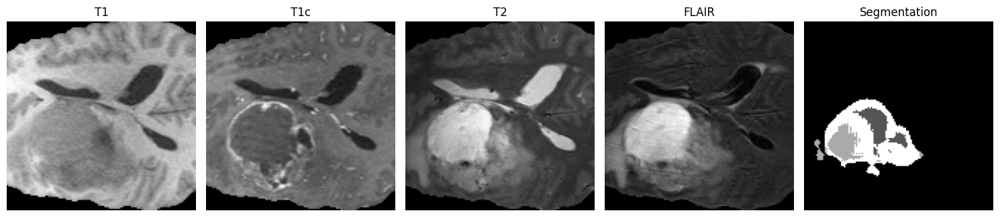

Processing Test Samples:   4%|▍         | 1/24 [00:03<01:21,  3.53s/sample]

Displayed results for Sample 1


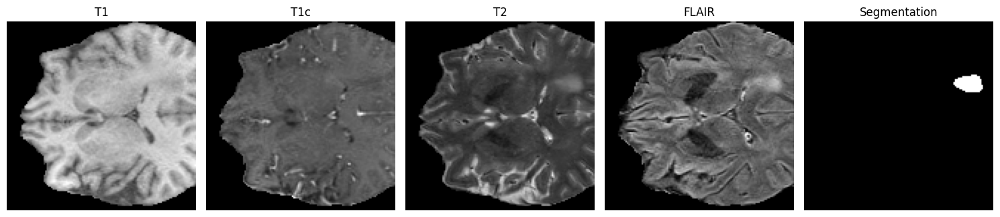

Processing Test Samples:   8%|▊         | 2/24 [00:07<01:18,  3.56s/sample]

Displayed results for Sample 2


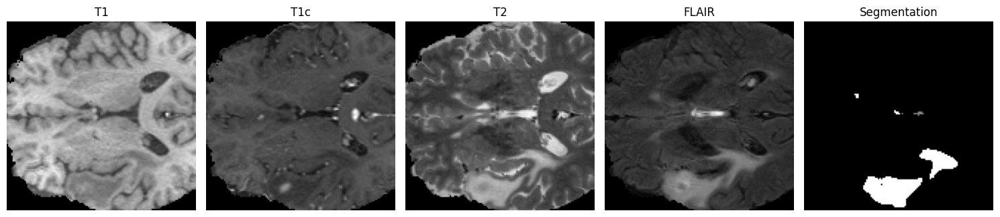

Processing Test Samples:  12%|█▎        | 3/24 [00:10<01:16,  3.66s/sample]

Displayed results for Sample 3


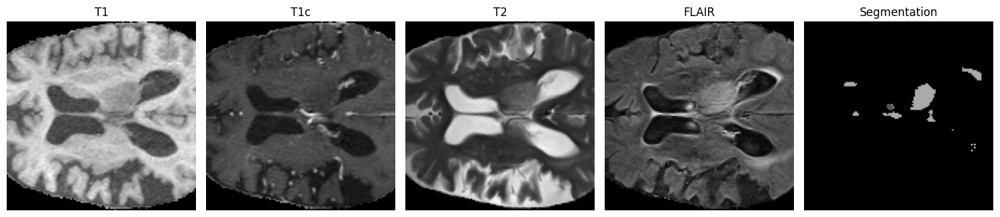

Processing Test Samples:  17%|█▋        | 4/24 [00:14<01:14,  3.73s/sample]

Displayed results for Sample 4


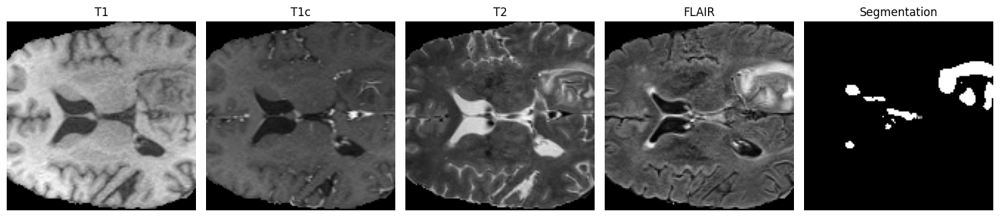

Processing Test Samples:  21%|██        | 5/24 [00:18<01:11,  3.76s/sample]

Displayed results for Sample 5


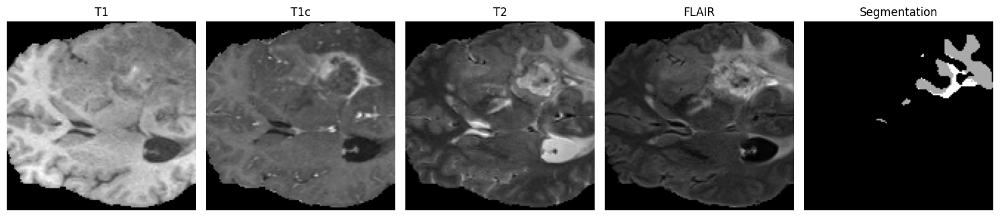

Processing Test Samples:  25%|██▌       | 6/24 [00:22<01:08,  3.80s/sample]

Displayed results for Sample 6


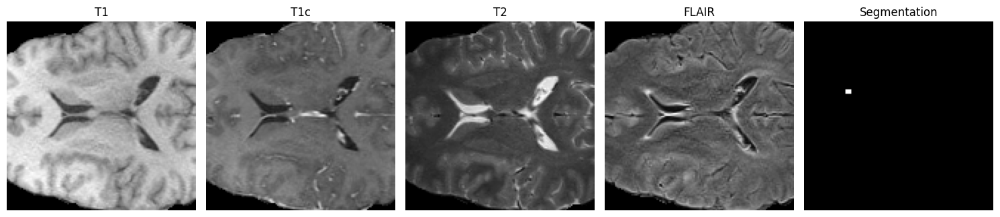

Processing Test Samples:  29%|██▉       | 7/24 [00:26<01:05,  3.83s/sample]

Displayed results for Sample 7


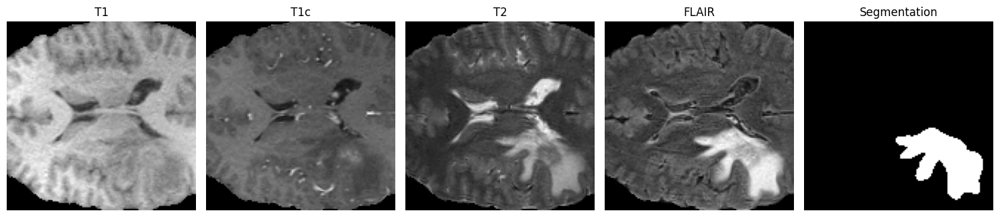

Processing Test Samples:  33%|███▎      | 8/24 [00:30<01:01,  3.83s/sample]

Displayed results for Sample 8


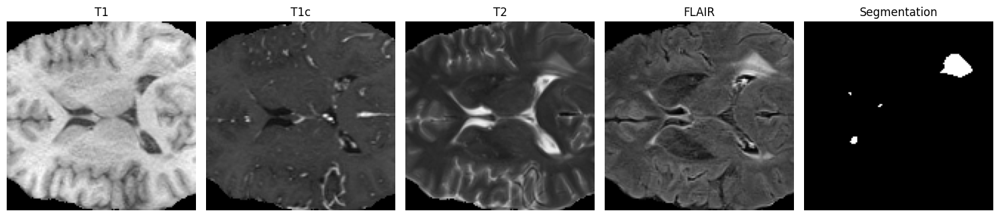

Processing Test Samples:  38%|███▊      | 9/24 [00:34<00:57,  3.84s/sample]

Displayed results for Sample 9


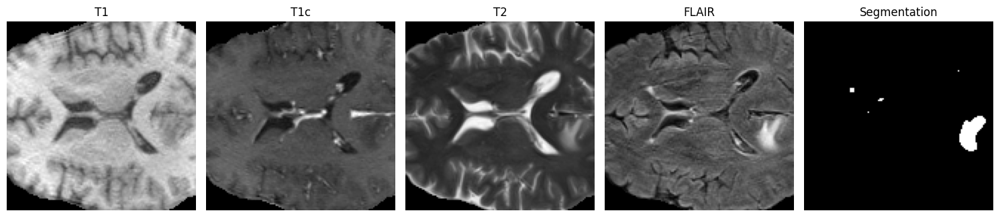

Processing Test Samples:  42%|████▏     | 10/24 [00:38<00:55,  3.96s/sample]

Displayed results for Sample 10


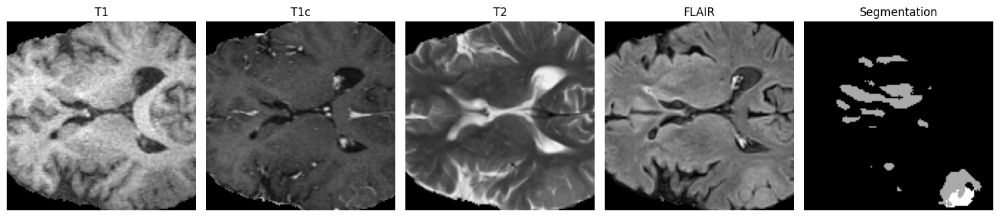

Processing Test Samples:  46%|████▌     | 11/24 [00:42<00:50,  3.92s/sample]

Displayed results for Sample 11


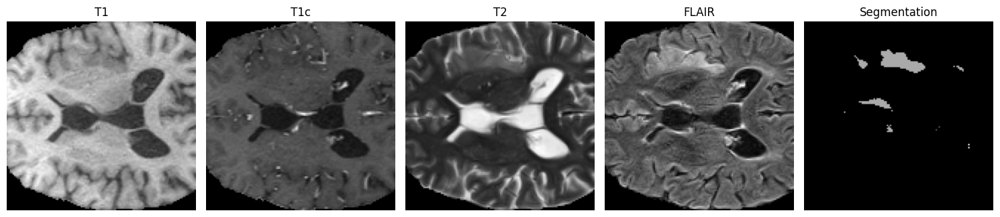

Processing Test Samples:  50%|█████     | 12/24 [00:46<00:47,  3.94s/sample]

Displayed results for Sample 12


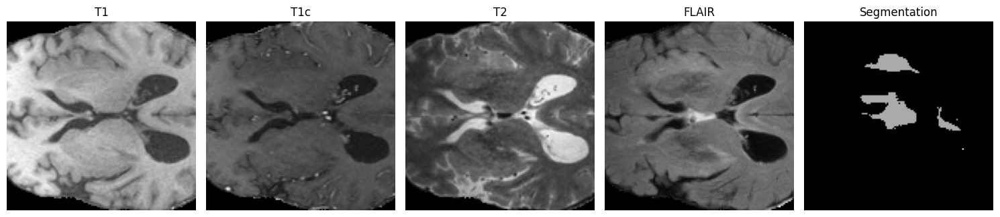

Processing Test Samples:  54%|█████▍    | 13/24 [00:50<00:43,  3.98s/sample]

Displayed results for Sample 13


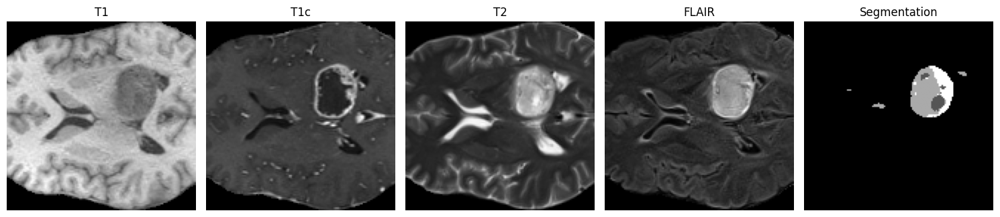

Processing Test Samples:  58%|█████▊    | 14/24 [00:54<00:40,  4.01s/sample]

Displayed results for Sample 14


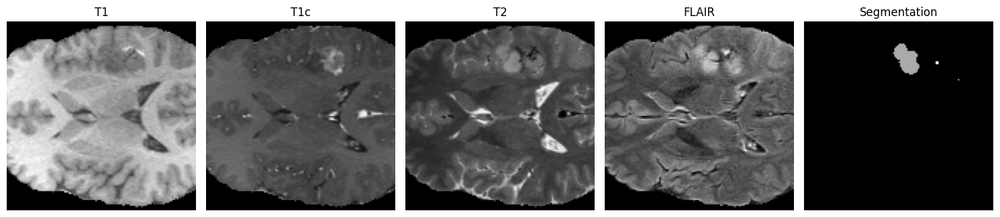

Processing Test Samples:  62%|██████▎   | 15/24 [00:58<00:36,  4.00s/sample]

Displayed results for Sample 15


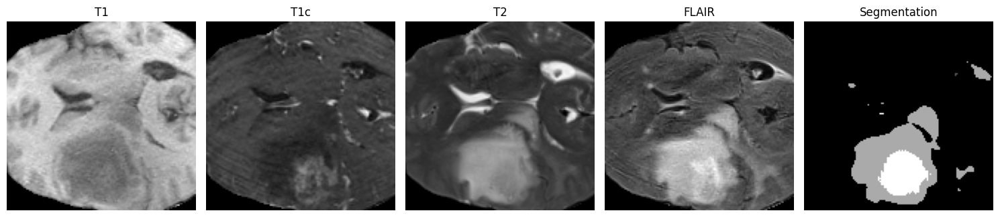

Processing Test Samples:  67%|██████▋   | 16/24 [01:02<00:31,  3.97s/sample]

Displayed results for Sample 16


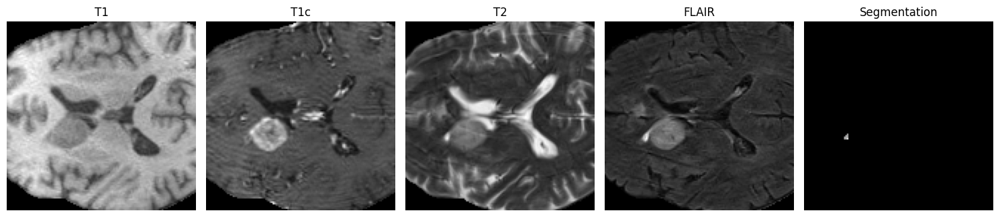

Processing Test Samples:  71%|███████   | 17/24 [01:05<00:27,  3.96s/sample]

Displayed results for Sample 17


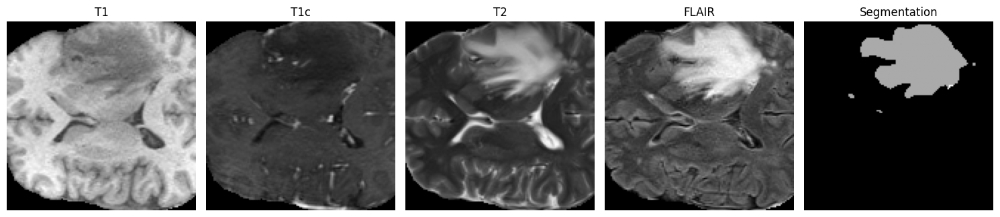

Processing Test Samples:  75%|███████▌  | 18/24 [01:09<00:23,  3.91s/sample]

Displayed results for Sample 18


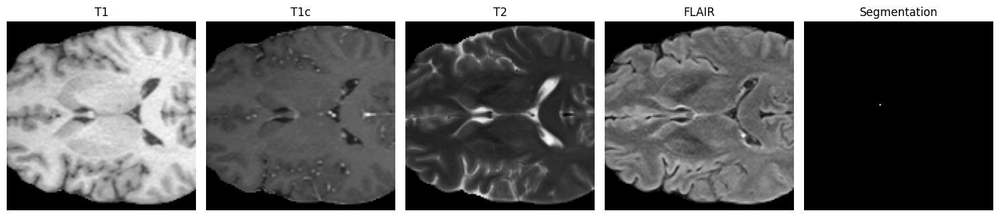

Processing Test Samples:  79%|███████▉  | 19/24 [01:13<00:19,  3.89s/sample]

Displayed results for Sample 19


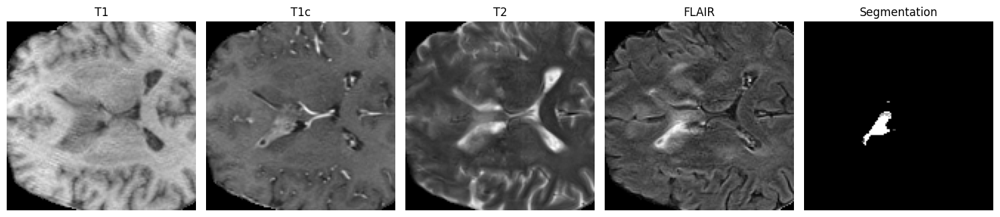

Processing Test Samples:  83%|████████▎ | 20/24 [01:17<00:15,  3.99s/sample]

Displayed results for Sample 20


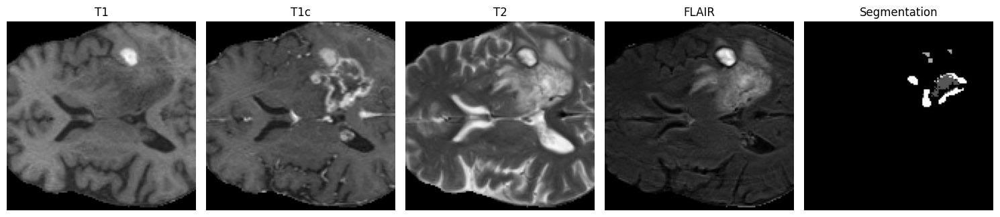

Processing Test Samples:  88%|████████▊ | 21/24 [01:22<00:12,  4.27s/sample]

Displayed results for Sample 21


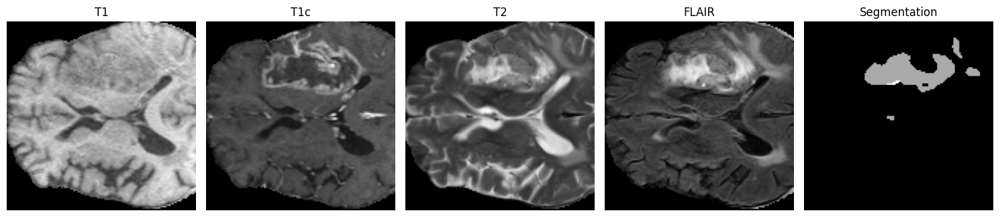

Processing Test Samples:  92%|█████████▏| 22/24 [01:27<00:08,  4.26s/sample]

Displayed results for Sample 22


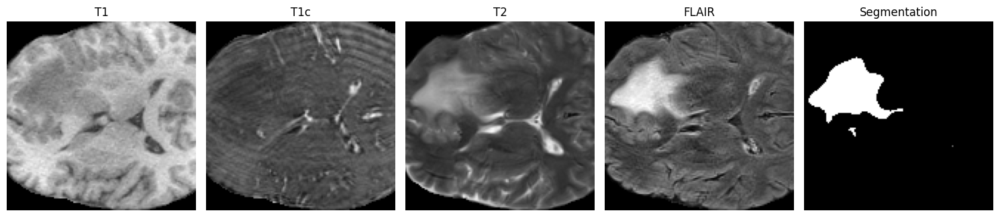

Processing Test Samples:  96%|█████████▌| 23/24 [01:31<00:04,  4.18s/sample]

Displayed results for Sample 23


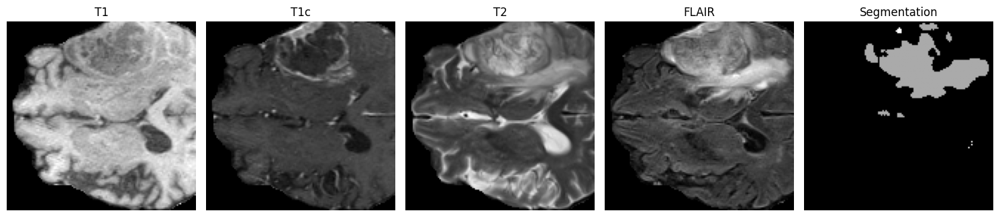

Processing Test Samples: 100%|██████████| 24/24 [01:34<00:00,  3.96s/sample]

Displayed results for Sample 24


In [28]:

def load_and_preprocess(file_path):
    nii_img = nib.load(file_path)
    data = nii_img.get_fdata()
    return data, nii_img.affine

def normalize_image(image):
    min_val = torch.min(image)
    max_val = torch.max(image)
    if max_val - min_val != 0:
        image = (image - min_val) / (max_val - min_val)
    else:
        image = torch.zeros_like(image)
    return image

def display_images_side_by_side(images, titles):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    
    for i, (image, title) in enumerate(zip(images, titles)):
        axes[i].imshow(image[:, :, image.shape[2] // 2], cmap="gray")  # Show the middle slice
        axes[i].set_title(title)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()

def generate_segmentation(model, image):
    model.eval()
    with torch.no_grad():
        output = model(image)
        pred = torch.argmax(output, dim=1)  # Get the predicted class for each voxel
        pred = pred.cpu().numpy()
    return pred

def display_test_folder_images_with_segmentation(test_folder_path, model, device, sample_idx):

    # Load the MRI images
    t1, affine = load_and_preprocess(os.path.join(test_folder_path, 'Img1_Native_T1.nii'))
    t1c, _ = load_and_preprocess(os.path.join(test_folder_path, 'Img2_T1_Gd_Weighted.nii'))
    t2, _ = load_and_preprocess(os.path.join(test_folder_path, 'Img3_T2_Weighted.nii'))
    flair, _ = load_and_preprocess(os.path.join(test_folder_path, 'Img4_T2_FLAIR.nii'))

    # Stack and normalize images
    image = torch.stack([torch.tensor(t1, dtype=torch.float32),
                         torch.tensor(t1c, dtype=torch.float32),
                         torch.tensor(t2, dtype=torch.float32),
                         torch.tensor(flair, dtype=torch.float32)], dim=0)
    image = torch.stack([normalize_image(img) for img in image])

    # Add batch dimension
    image = image.unsqueeze(0).to(device)

    # Generate segmentation
    segmentation = generate_segmentation(model, image)

    # Prepare images and titles for display
    images = [t1, t1c, t2, flair, segmentation[0]]
    titles = ['T1', 'T1c', 'T2', 'FLAIR', 'Segmentation']

    # Display images side by side
    display_images_side_by_side(images, titles)
    print(f"Displayed results for Sample {sample_idx}")

# Example usage
if __name__ == "__main__":
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Load the trained model
    model_path = "best_model.pth"  
    model = UNet3D(in_channels=4, out_channels=4)  
    model.load_state_dict(torch.load(model_path, map_location=device))
    model = model.to(device)

    # Loop through all 24 test samples with progress bar
    base_test_folder = r"E:\Test\Test_Data"  # Replace with actual base folder path
    for i in tqdm(range(1, 25), desc="Processing Test Samples", unit="sample"): 
        test_folder_path = os.path.join(base_test_folder, f"Test_{i}")  
        display_test_folder_images_with_segmentation(test_folder_path, model, device, sample_idx=i)
